# Network Analysis of Publications on Studies of Parkinson Disease

In [ ]:
import pandas as pd
import ast
from ast import literal_eval
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from matplotlib import rcParams
warnings.filterwarnings('ignore')
from tqdm.notebook import tqdm
from collections import Counter
import os.path
from os import path

import sys
import networkx as nx
import pickle

In [ ]:
def read_data(path, sep):
    df = pd.read_csv(path, sep=sep)
    df.loc[:, 'AA'] = df['AA'].apply(lambda x: ast.literal_eval(x))
    df.loc[:, 'W'] = df['W'].apply(lambda x: ast.literal_eval(x))
    return df

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
data = read_data('drive/MyDrive/filtered_data.csv', sep = ';')

In [ ]:
affiliation_data = data[['Id', 'AA', 'Y']].copy().rename(columns = {'Y':'Year'})
affiliation_data.dropna(subset = ['AA'], inplace = True, axis = 0)

In [ ]:
type(affiliation_data.loc[0, 'AA'])

list

## Co-author affiliation network

In [ ]:
co_affiliation_net = []
id_name = []
isolated = []
cnt_aff = []

for k in tqdm(range(len(affiliation_data))):
    affiliations = affiliation_data.loc[k, 'AA']
    unique_affiliations = []

    for i in range(len(affiliations)):
        if affiliations[i]['AfId'] is not None:
            unique_affiliations.append(affiliations[i]['AfId'])
            id_name.append([affiliations[i]['AfId'], affiliations[i]['DAfN']])
    
    loops = dict(filter(lambda val: val[1] > 1, dict(Counter(unique_affiliations)).items())).keys()

    for aff in list(loops):
        co_affiliation_net.append([aff, aff, affiliation_data.loc[k, 'Year'], 1])
    
    unique_affiliations = list(set(unique_affiliations))
    cnt_aff.append(len(unique_affiliations))

    if len(unique_affiliations) == 1 and unique_affiliations[0] not in loops:
        isolated.append([unique_affiliations[0], affiliation_data.loc[k, 'Year'], 1])

    for i in range(len(unique_affiliations)):
        for j in range(len(unique_affiliations)):
            if j > i:
                aff1 = unique_affiliations[i]
                aff2 = unique_affiliations[j]
                
                if aff1 == aff2:
                   print(k, i, j)

                co_affiliation_net.append([min(aff1, aff2), max(aff1, aff2), affiliation_data.loc[k, 'Year'], 1])

co_affiliation_net = pd.DataFrame(co_affiliation_net).rename(columns = {0:'AfId1', 1:'AfId2', 2:'Y', 3:'weight'})
isolated = pd.DataFrame(isolated).rename(columns = {0:'AfId', 1:'Y', 2:'weight'})
id_name = pd.DataFrame(id_name).rename(columns = {0:'AfId', 1:'AfN'})
id_name.drop_duplicates(['AfId', 'AfN'], inplace = True)

  0%|          | 0/39811 [00:00<?, ?it/s]

In [ ]:
id_name

,AfId,AfN
0,39854758,Auckland University of Technology
1,165143802,University of Queensland
2,1443707,Jimma University
3,145487455,Cairo University
4,120250893,New York University Abu Dhabi
...,...,...
248330,167724894,Universidad Autónoma de la Ciudad de México
248372,913583111,College of Information Technology
248384,201850948,Fulda University of Applied Sciences
248387,148195559,Nera


In [ ]:
co_affiliation_net = co_affiliation_net.groupby(['AfId1', 'AfId2', 'Y']).sum().reset_index()
isolated = isolated[isolated['AfId'].isin(list(set(co_affiliation_net['AfId1']) | set(co_affiliation_net['AfId2']))) == False]
isolated = isolated.groupby(['AfId', 'Y']).sum().reset_index()

In [ ]:
co_affiliation_net

,AfId1,AfId2,Y,weight
0,4605,57206974,2017,1
1,9507,9507,2021,2
2,9507,35928602,2021,1
3,9507,83202590,2020,1
4,9507,90735388,2020,1
...,...,...,...,...
136400,3143470655,3143470655,2020,1
136401,3143470655,3143470655,2021,1
136402,3148997608,3148997608,2016,1
136403,3148997608,3148997608,2019,1


In [ ]:
isolated

,AfId,Y,weight
0,8882099,2021,1
1,11587721,2016,1
2,14245010,2017,1
3,15949855,2017,1
4,19923696,2018,1
...,...,...,...
62,2802366037,2019,1
63,2802603828,2015,1
64,3122449915,2019,1
65,3132422250,2017,1


In [ ]:
# plt.hist(co_author_net[co_author_net['weight'] > 1])
# plt.show()

In [ ]:
print('The number of edges:', co_affiliation_net.shape[0])
print('The number of vertices:', len(set(co_affiliation_net['AfId1'].values) | set(co_affiliation_net['AfId2'].values)))

The number of edges: 136405
The number of vertices: 4634


In [ ]:
co_affiliation_net.to_csv('drive/MyDrive/co_affiliation_net.csv', sep = ';', index = False)

In [ ]:
co_affiliation_net[['AfId1', 'AfId2', 'weight']].to_csv('drive/MyDrive/co_affiliation_net.txt', sep = '\t', index = False, header = False)

In [ ]:
id_name.to_csv('drive/MyDrive/affiliations.csv', sep = ';', index = False)

In [ ]:
isolated.to_csv('drive/MyDrive/isolated_affiliations.csv', sep = ';', index = False)

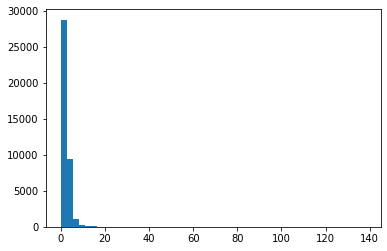

In [ ]:
plt.hist(cnt_aff, bins = 50)
plt.show()

In [ ]:
pd.Series(cnt_aff).describe()

count    39811.000000
mean         2.150536
std          2.392112
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max        138.000000
dtype: float64

# Centrality analysis

## No periods

In [ ]:
co_aff_net_no_periods = co_affiliation_net.groupby(['AfId1', 'AfId2']).sum()['weight'].reset_index()

co_aff_net_no_periods.to_csv('drive/MyDrive/co_affiliations_net_no_periods.csv', sep = '\t', index = False, header = False)

aff_net = pd.read_csv('drive/MyDrive/co_affiliations_net_no_periods.csv', sep = '\t', header = None)
aff_net.rename(columns = {0:'AfId1', 1:'AfId2', 2:'weight'}, inplace = True)

In [ ]:
G = nx.read_weighted_edgelist('drive/MyDrive/co_affiliations_net_no_periods.csv', delimiter='\t', nodetype = int)

In [ ]:
degree_centrality = pd.DataFrame.from_dict(dict(G.degree()), orient = 'index').reset_index().rename(columns = {0:'Degree', 'index':'AfId'})
degree_centrality.loc[:, 'Degree centrality'] = degree_centrality.loc[:, 'Degree'] / np.sum(list(dict(G.degree()).values()))
degree_centrality['Degree centrality rank'] = degree_centrality['Degree centrality'].rank(method = 'dense', ascending = False)

eigen = pd.DataFrame.from_dict(nx.eigenvector_centrality(G), orient = 'index').reset_index().rename(columns = {0:'Eigenvector', 'index':'AfId'})
eigen['Eigenvector rank'] = eigen['Eigenvector'].rank(method = 'dense', ascending = False)

pr = pd.DataFrame.from_dict(nx.pagerank(G), orient = 'index').reset_index().rename(columns = {0:'PageRank', 'index':'AfId'})
pr['PageRank rank'] = pr['PageRank'].rank(method = 'dense', ascending = False)

between = pd.DataFrame.from_dict(nx.betweenness_centrality(G), orient = 'index').reset_index().rename(columns = {0:'Betweenness', 'index':'AfId'})
between['Betweenness rank'] = between['Betweenness'].rank(method = 'dense', ascending = False)

affiliations_info = affiliations[affiliations['AfId'].isin(set(aff_net['AfId1'].values) | set(aff_net['AfId2'].values))].copy()
affiliations_info = affiliations_info.merge(degree_centrality, on = 'AfId')
affiliations_info = affiliations_info.merge(eigen, on = 'AfId')
affiliations_info = affiliations_info.merge(pr, on = 'AfId')
affiliations_info = affiliations_info.merge(between, on = 'AfId')

In [ ]:
affiliations_info.sort_values('Degree', ascending = False).head(10)

,AfId,AfN,Degree,Degree centrality,Degree centrality rank,Eigenvector,Eigenvector rank,PageRank,PageRank rank,Betweenness,Betweenness rank
17,136199984,Harvard University,814,0.004738,1.0,0.102718,2.0,0.005765,2.0,0.032139,1.0
83,1299303238,National Institutes of Health,784,0.004563,2.0,0.103103,1.0,0.006510,1.0,0.027055,2.0
31,241749,University of Cambridge,726,0.004226,3.0,0.090740,9.0,0.005671,3.0,0.025554,3.0
60,45129253,University College London,725,0.004220,4.0,0.096339,3.0,0.004821,6.0,0.022443,4.0
130,183935753,King's College London,677,0.003941,5.0,0.095964,4.0,0.004668,7.0,0.019467,5.0
140,79576946,University of Pennsylvania,629,0.003661,6.0,0.087680,12.0,0.005260,4.0,0.016268,6.0
37,28166907,Karolinska Institutet,627,0.003650,7.0,0.093134,5.0,0.003923,11.0,0.014016,9.0
151,1330342723,Mayo Clinic,620,0.003609,8.0,0.087254,13.0,0.004346,9.0,0.015982,8.0
206,185261750,University of Toronto,600,0.003492,9.0,0.084437,16.0,0.003983,10.0,0.016030,7.0
139,2801533059,German Center for Neurodegenerative Diseases,599,0.003487,10.0,0.084899,15.0,0.005182,5.0,0.013004,13.0


In [ ]:
affiliations_info.to_csv('drive/MyDrive/co_affiliation_info.csv', sep = ';', index = False)

In [ ]:
affiliations_info = pd.read_csv('drive/MyDrive/co_affiliation_info.csv', sep = ';')

In [ ]:
affiliations_info[affiliations_info['AfId'] == 115076166]

,AfId,AfN,Degree,Degree centrality,Degree centrality rank,Eigenvector,Eigenvector rank,PageRank,PageRank rank,Betweenness,Betweenness rank
174,115076166,UCL Institute of Neurology,539,0.003137,17.0,0.072296,34.0,0.004617,8.0,0.013044,12.0


In [ ]:
affiliations_info[affiliations_info['AfId'] == 40120149]

,AfId,AfN,Degree,Degree centrality,Degree centrality rank,Eigenvector,Eigenvector rank,PageRank,PageRank rank,Betweenness,Betweenness rank
20,40120149,University of Oxford,576,0.003353,13.0,0.088847,10.0,0.003649,12.0,0.009092,30.0


In [ ]:
affiliations_info[affiliations_info['AfId'] == 111979921]

,AfId,AfN,Degree,Degree centrality,Degree centrality rank,Eigenvector,Eigenvector rank,PageRank,PageRank rank,Betweenness,Betweenness rank
134,111979921,Northwestern University,534,0.003108,18.0,0.082708,21.0,0.003173,21.0,0.008972,32.0


In [ ]:
affiliations_info[affiliations_info['AfId'] == 99464096]

,AfId,AfN,Degree,Degree centrality,Degree centrality rank,Eigenvector,Eigenvector rank,PageRank,PageRank rank,Betweenness,Betweenness rank
219,99464096,Katholieke Universiteit Leuven,232,0.00135,122.0,0.035122,243.0,0.001263,123.0,0.003302,137.0


## Periods

In [ ]:
degree_centrality = affiliations.copy()
pr = affiliations.copy()
eigen = affiliations.copy()
between = affiliations.copy()

for year in range(2015, 2022):
    print(year)
    net_year = co_affiliation_net[co_affiliation_net['Y'] == year]
    net_year[['AfId1', 'AfId2', 'weight']].to_csv(f'net_{year}.txt', sep = '\t', index = False, header = False)

    G_year = nx.read_weighted_edgelist(f'net_{year}.txt', delimiter='\t', nodetype = int)
        
    tmp = pd.DataFrame.from_dict(dict(G_year.degree()), orient = 'index').reset_index().rename(columns = {0:year, 'index':'AfId'})
    tmp.loc[:, year] = tmp.loc[:, year] / np.sum(list(dict(G_year.degree()).values()))
    degree_centrality = degree_centrality.merge(tmp, on = 'AfId', how = 'left') 

    eigen = eigen.merge(pd.DataFrame.from_dict(nx.eigenvector_centrality(G_year), orient = 'index').reset_index().rename(columns = {0:year, 'index':'AfId'}), on = 'AfId', how = 'left')

    pr = pr.merge(pd.DataFrame.from_dict(nx.pagerank(G_year), orient = 'index').reset_index().rename(columns = {0:year, 'index':'AfId'}),  on = 'AfId', how = 'left')

    between = between.merge(pd.DataFrame.from_dict(nx.betweenness_centrality(G_year), orient = 'index').reset_index().rename(columns = {0:year, 'index':'AfId'}),  on = 'AfId', how = 'left')


degree_centrality.fillna(0, inplace = True)
degree_centrality = degree_centrality.merge(affiliations_info[['AfId', 'Degree centrality', 'Degree centrality rank']], on = 'AfId')    

pr.fillna(0, inplace = True)
pr = pr.merge(affiliations_info[['AfId', 'PageRank', 'PageRank rank']], on = 'AfId')    

eigen.fillna(0, inplace = True)
eigen = eigen.merge(affiliations_info[['AfId', 'Eigenvector', 'Eigenvector rank']], on = 'AfId')

between.fillna(0, inplace = True)
between = between.merge(affiliations_info[['AfId', 'Betweenness', 'Betweenness rank']], on = 'AfId')

2015
2016
2017
2018
2019
2020
2021


In [ ]:
degree_centrality.to_csv('Degree.txt', sep = '\t', index = False)
pr.to_csv('PageRank.txt', sep = '\t', index = False)
eigen.to_csv('Eigen.txt', sep = '\t', index = False)
between.to_csv('Between.txt', sep = '\t', index = False)

In [ ]:
writer = pd.ExcelWriter('drive/MyDrive/index_co_affiliations_periods.xlsx', engine='openpyxl')

degree_centrality.to_excel(writer, sheet_name='Degree', index = False)
between.to_excel(writer, sheet_name='Between', index = False)
eigen.to_excel(writer, sheet_name='Eigen', index = False)
pr.to_excel(writer, sheet_name='PageRank', index = False)

writer.save()

# Dynamic network analysis 

In [ ]:
co_affiliation_net = pd.read_csv('drive/MyDrive/co_affiliation_net.csv', sep = ';')
isolated = pd.read_csv('drive/MyDrive/isolated_affiliations.csv', sep = ';')
affiliations = pd.read_csv('drive/MyDrive/affiliations.csv', sep = ';')

In [ ]:
def graph_statistics(net, isolated, directed = False, dynamic = True):

    net_metrics = pd.DataFrame()
    net_prev_year = None
    prev_nodes = set()
    prev_edges = set()
    all_prev_nodes = set()
    all_prev_edges = set()

    for year in range(2015, 2022):
        print(year)
        
        if not dynamic:
            net_year = net
            isolated_year = isolated
        else:
            net_year = net[net['Y'] == year]
            isolated_year = isolated[isolated['Y'] == year]

        net_year[['AfId1', 'AfId2', 'weight']].to_csv(f'net_{year}.txt', sep = '\t', index = False, header = False)

        if directed:
            G_year = nx.read_weighted_edgelist(f'net_{year}.txt', delimiter='\t', create_using=nx.DiGraph)
        else:
            G_year = nx.read_weighted_edgelist(f'net_{year}.txt', delimiter='\t')
        
        G_year.add_nodes_from(isolated_year['AfId'])
        

        # Connected components and sizes
        if directed:
            components = nx.weakly_connected_components(G_year)
        else:
            components = nx.connected_components(G_year)
        comp_df = pd.DataFrame()
        i = 1
        for comp in components:
            for au in comp:
                comp_df.loc[au, 'component'] = i
            i += 1
                    
        comp_df = comp_df.reset_index().rename(columns = {'index': 'AfId'})
        cnt_comp = comp_df.groupby('component').count().reset_index().rename(columns = {'AfId':'count'})
       
        # Average path
        if directed:
            strong_components = nx.strongly_connected_components(G_year)
        else:
            strong_components = nx.connected_components(G_year)
            
        

        degrees = [val for (node, val) in G_year.degree()]

        net_metrics.loc['Number of vertices', year] = len(set(net_year['AfId1']) | set(net_year['AfId2']) | set(isolated_year['AfId']))
        net_metrics.loc['Number of edges', year] = len(net_year)
        net_metrics.loc['Number of isolated vertices', year] = len(set(isolated_year['AfId']))
        net_metrics.loc['Proportion of isolated vertices', year] = len(set(isolated_year['AfId'])) / len(set(net_year['AfId1']) | set(net_year['AfId2']))
        net_metrics.loc['Number of components', year] = i - 1
        net_metrics.loc['Average degree', year] = np.mean(degrees)
        net_metrics.loc['Minimum degree', year] = np.min(degrees)
        net_metrics.loc['Maximum degree', year] = np.max(degrees)
        net_metrics.loc['Density', year] = nx.density(G_year)
        
        net_metrics.loc['Size of the biggest component', year] = max(cnt_comp['count'])
        net_metrics.loc['Proportion of vertices in the biggest component', year] = max(cnt_comp['count']) / len(set(net_year['AfId1']) | set(net_year['AfId2']) | set(isolated_year['AfId']))
        net_metrics.loc['Size of the 2nd biggest component', year] = max(cnt_comp[cnt_comp['count'] != max(cnt_comp['count'])]['count'])
        net_metrics.loc['Size of the 3rd biggest component', year] = max(cnt_comp[(cnt_comp['count'] != max(cnt_comp['count'])) & (cnt_comp['count'] != net_metrics.loc['Size of the 2nd biggest component', year])]['count'])
        
        nodes = set(net_year['AfId1']) | set(net_year['AfId2']) | set(isolated_year['AfId'])
        edges = set(net_year[['AfId1', 'AfId2']].to_records()[['AfId1', 'AfId2']].tolist())
        
        if net_prev_year is not None:
            net_metrics.loc['New nodes', year] = len(nodes - all_prev_nodes) / len(nodes)
            net_metrics.loc['New edges', year] = len(edges - all_prev_edges) / len(edges)
            net_metrics.loc['Remaining nodes', year] = len(nodes & prev_nodes) / len(nodes)
            net_metrics.loc['Remaining edges', year] = len(edges & prev_edges) / len(edges)
            net_metrics.loc['Reoccurring nodes', year] = len(nodes & (all_prev_nodes - prev_nodes)) / len(nodes)
            net_metrics.loc['Reoccurring edges', year] = len(edges & (all_prev_edges - prev_edges)) / len(edges)
            

        net_prev_year = net_year.copy()
        prev_nodes = nodes.copy()
        prev_edges = edges.copy()
        all_prev_nodes = all_prev_nodes | nodes
        all_prev_edges = all_prev_edges | edges
        
        if not dynamic:
            break
        

    return net_metrics

In [ ]:
aff_net = pd.read_csv('drive/MyDrive/co_affiliations_net_no_periods.csv', sep = '\t', header = None)
aff_net.rename(columns = {0:'AfId1', 1:'AfId2', 2:'weight'}, inplace = True)

In [ ]:
net_metrics_all = graph_statistics(aff_net, isolated, directed = False, dynamic = False)

2015


In [ ]:
net_metrics_all

,2015
Number of vertices,4697.000000
Number of edges,85900.000000
Number of isolated vertices,63.000000
Proportion of isolated vertices,0.013595
Number of components,270.000000
Average degree,36.576538
Minimum degree,0.000000
Maximum degree,814.000000
Density,0.007789
Size of the biggest component,4396.000000


In [ ]:
net_metrics = graph_statistics(co_affiliation_net, isolated, directed = False)

2015
2016
2017
2018
2019
2020
2021


In [ ]:
net_metrics

,2015,2016,2017,2018,2019,2020,2021
Number of vertices,1799.000000,1980.000000,2129.000000,2110.000000,2316.000000,2541.000000,2654.000000
Number of edges,11440.000000,16901.000000,23193.000000,15996.000000,17864.000000,26031.000000,24980.000000
Number of isolated vertices,12.000000,6.000000,4.000000,7.000000,12.000000,14.000000,12.000000
Proportion of isolated vertices,0.006715,0.003040,0.001882,0.003329,0.005208,0.005540,0.004542
Number of components,188.000000,188.000000,188.000000,182.000000,214.000000,210.000000,197.000000
Average degree,12.718177,17.071717,21.787694,15.162085,15.426598,20.488784,18.824416
Minimum degree,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Maximum degree,185.000000,249.000000,320.000000,222.000000,252.000000,343.000000,318.000000
Density,0.007074,0.008626,0.010239,0.007189,0.006664,0.008066,0.007096
Size of the biggest component,1564.000000,1731.000000,1892.000000,1884.000000,2029.000000,2280.000000,2402.000000


## Stability analysis

In [ ]:
def distance(M1, M2):
    return np.abs(np.array(M1) - np.array(M2)).sum()
    
def net_stability(net, ranks, eps):

    stability = []
    distance_C = []
    distance_R = []
    C = []
    R = []

    for year in tqdm(range(2015, 2022)):
        net_cur = net[net['Y'] == year]
        if year < 2020:
            pkl_file = open(f'drive/MyDrive/Stability/R_{eps}_{year}.pkl', 'rb')
            R_t = pickle.load(pkl_file)
            pkl_file.close()
        else:
            R_t = []
            for i in tqdm(range(len(ranks))):
                row_t = []
                for j in range(len(ranks)):
                    rt = int(ranks.loc[i, year] - ranks.loc[j, year] > eps)
                    row_t.append(rt)

                R_t.append(row_t)

        R.append(R_t)

        output = open(f'drive/MyDrive/Stability/R_{eps}_{year}.pkl', 'wb')
        pickle.dump(R_t, output)
        output.close()

        if year < 2020:
            pkl_file = open(f'drive/MyDrive/Stability/C_{eps}_{year}.pkl', 'rb')
            C_t = pickle.load(pkl_file)
            pkl_file.close()
        else:
            C_t = []

            for i in tqdm(range(len(ranks))):
                af_i = ranks.loc[i, 'AfId']
                
                if af_i not in net_cur['AfId1'].values:
                    C_t.append([0] * len(ranks))
                    continue

                row_t = []
                for j in range(len(ranks)):
                    af_j = ranks.loc[j, 'AfId']
                    if af_j not in net_cur['AfId2'].values:
                        row_t.append(0)
                    else:
                        net_tmp = net_cur[net_cur['AfId2'] == af_j]

                        if len(net_tmp[net_tmp['AfId1'] == af_i]) == 0:
                            row_t.append(0)
                        else:
                            row_t.append(net_tmp[net_tmp['AfId1'] == af_i]['weight'].values[0] / net_tmp['weight'].sum())
                        
                C_t.append(row_t)

        C.append(C_t)

        output = open(f'drive/MyDrive/Stability/C_{eps}_{year}.pkl', 'wb')
        pickle.dump(C_t, output)
        output.close()

      
    for i in tqdm(range(1, len(C))):
        R_t = R[i-1]
        R_t1 = R[i]
        C_t = C[i-1]
        C_t1 = C[i]
        
        gamma = max(np.max(C_t), np.max(C_t1))
        d_C = distance(C_t, C_t1) / (len(ranks)**2 * gamma)
        distance_C.append(d_C)

        d_R = distance(R_t, R_t1) / (len(ranks) * (len(ranks) - 1))
        distance_R.append(d_R)

        res = np.sqrt((d_R**2 + d_C**2)/2)
        stability.append(res)
    
    return stability, distance_R, distance_C, R, C


In [ ]:
co_affiliation_net = pd.read_csv('drive/MyDrive/co_affiliation_net.csv', sep = ';')
isolated = pd.read_csv('drive/MyDrive/isolated_affiliations.csv', sep = ';')
affiliations = pd.read_csv('drive/MyDrive/affiliations.csv', sep = ';')

In [ ]:
tmp = co_affiliation_net[co_affiliation_net['AfId1'] != co_affiliation_net['AfId2']].copy()
tmp.rename(columns = {'AfId1':'AfId2', 'AfId2':'AfId1'}, inplace = True)

In [ ]:
co_affiliation_net = pd.concat([co_affiliation_net[['AfId1', 'AfId2', 'Y', 'weight']], tmp[['AfId1', 'AfId2', 'Y', 'weight']]]).reset_index(drop = True)

In [ ]:
degree = pd.read_excel('drive/MyDrive/index_co_affiliations_periods.xlsx', sheet_name = 'Degree')

In [ ]:
degree_ranks = degree[['AfN',	'AfId',	2015,	2016,	2017,	2018,	2019,	2020,	2021]].copy()

In [ ]:
for year in [2015,	2016,	2017,	2018,	2019,	2020,	2021]:
    degree_ranks.loc[:, year] = degree_ranks[year].rank(method = 'dense', ascending = False)

In [ ]:
stability, d_R, d_C, R, C = net_stability(co_affiliation_net, degree_ranks, 5)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4634 [00:00<?, ?it/s]

  0%|          | 0/4634 [00:00<?, ?it/s]

  0%|          | 0/4634 [00:00<?, ?it/s]

  0%|          | 0/4634 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
stability

[0.07908673952317694,
 0.09283807953250794,
 0.0912350067029613,
 0.08953306039163084,
 0.101126588721043,
 0.10672964359009082]

In [ ]:
d_R

[0.11184545091829169,
 0.1312927813929103,
 0.12902568604635023,
 0.12661876327533772,
 0.14301448364321892,
 0.15093839479420915]

In [ ]:
d_C

[0.00014087475883953915,
 0.0001535470026001571,
 0.00015885983584368833,
 0.00016307301069615364,
 0.0001770902973994999,
 0.00018606096603501784]

In [ ]:
print('Organisations with the largest self co-authorship')
co_affiliation_net[co_affiliation_net['AfId1'] == co_affiliation_net['AfId2']].merge(affiliations, how = 'left', left_on = 'AfId1', right_on = 'AfId')[['AfId', 'AfN', 'Y', 'weight']].sort_values('weight', ascending = False).head(20)

Organisations with the largest self co-authorship


,AfId,AfN,Y,weight
9243,1299303238,National Institutes of Health,2020,88
9244,1299303238,National Institutes of Health,2021,83
20,241749,University of Cambridge,2021,76
19,241749,University of Cambridge,2020,76
9242,1299303238,National Institutes of Health,2019,75
4552,115076166,UCL Institute of Neurology,2021,68
7388,183067930,Shanghai Jiao Tong University,2021,63
7387,183067930,Shanghai Jiao Tong University,2020,62
17,241749,University of Cambridge,2018,61
1895,45129253,University College London,2020,57


In [ ]:
print('Organisations with the largest self co-authorship in 7-year period')
tmp = co_affiliation_net.groupby(['AfId1', 'AfId2']).sum().reset_index()[['AfId1', 'AfId2', 'weight']]
tmp[tmp['AfId1'] == tmp['AfId2']].merge(affiliations, how = 'left', left_on = 'AfId1', right_on = 'AfId')[['AfId', 'AfN', 'weight']].sort_values('weight', ascending = False).head(20)


Organisations with the largest self co-authorship in 7-year period


,AfId,AfN,weight
2653,1299303238,National Institutes of Health,448
5,241749,University of Cambridge,405
1290,115076166,UCL Institute of Neurology,324
2107,183067930,Shanghai Jiao Tong University,314
2109,183519381,Capital Medical University,303
513,45129253,University College London,285
897,79576946,University of Pennsylvania,279
336,28166907,Karolinska Institutet,278
460,40120149,University of Oxford,276
3009,2801533059,German Center for Neurodegenerative Diseases,276


In [ ]:
print('Organisations with the largest self co-authorship in different years')
for y in [2015, 2016, 2017, 2018, 2019, 2020, 2021]:
    print(y)
    display(co_affiliation_net[(co_affiliation_net['AfId1'] == co_affiliation_net['AfId2']) & (co_affiliation_net['Y'] == y)].merge(affiliations, how = 'left', left_on = 'AfId1', right_on = 'AfId')[['AfId', 'AfN', 'Y', 'weight']].sort_values('weight', ascending = False).head(5))

Organisations with the largest self co-authorship in different years
2015


,AfId,AfN,Y,weight
1072,1299303238,National Institutes of Health,2015,55
948,201448701,University of Washington,2015,41
2,241749,University of Cambridge,2015,38
854,183519381,Capital Medical University,2015,37
197,40120149,University of Oxford,2015,35


2016


,AfId,AfN,Y,weight
1171,1299303238,National Institutes of Health,2016,53
1,241749,University of Cambridge,2016,51
579,115076166,UCL Institute of Neurology,2016,49
1223,1330342723,Mayo Clinic,2016,45
788,154526488,French Institute of Health and Medical Research,2016,40


2017


,AfId,AfN,Y,weight
1269,1299303238,National Institutes of Health,2017,50
2,241749,University of Cambridge,2017,46
628,115076166,UCL Institute of Neurology,2017,45
1024,183067930,Shanghai Jiao Tong University,2017,41
1396,2801533059,German Center for Neurodegenerative Diseases,2017,41


2018


,AfId,AfN,Y,weight
2,241749,University of Cambridge,2018,61
1020,183067930,Shanghai Jiao Tong University,2018,49
619,115076166,UCL Institute of Neurology,2018,47
1022,183519381,Capital Medical University,2018,44
1267,1299303238,National Institutes of Health,2018,44


2019


,AfId,AfN,Y,weight
1395,1299303238,National Institutes of Health,2019,75
2,241749,University of Cambridge,2019,57
251,40120149,University of Oxford,2019,53
483,79576946,University of Pennsylvania,2019,49
186,28166907,Karolinska Institutet,2019,44


2020


,AfId,AfN,Y,weight
1505,1299303238,National Institutes of Health,2020,88
3,241749,University of Cambridge,2020,76
1197,183067930,Shanghai Jiao Tong University,2020,62
308,45129253,University College London,2020,57
280,40120149,University of Oxford,2020,57


2021


,AfId,AfN,Y,weight
1559,1299303238,National Institutes of Health,2021,83
2,241749,University of Cambridge,2021,76
766,115076166,UCL Institute of Neurology,2021,68
1245,183067930,Shanghai Jiao Tong University,2021,63
1738,2801533059,German Center for Neurodegenerative Diseases,2021,55


# Community detection

Experiments with visualisation

In [ ]:
import urllib
import numpy as nр
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms import community
from community import community_louvain
import pandas as pd
from IPython.display import display, HTML, display_pretty
import os
%matplotlib inline

In [ ]:
# Louvain's community detection method
def detect_communities_louvain(G):
    partition = community_louvain.best_partition(G)
    communities = list()
    for com in set(partition.values()) :
        list_nodes = [nodes for nodes in partition.keys() if partition[nodes] == com]
        communities.append(sorted(list_nodes))
    return sorted(communities)
  
# Girvan Newman's community detection method
def detect_communities_girvan_newman(G):
    communities = community.girvan_newman(G)
    return sorted(sorted(c) for c in communities)

# Fast Greedy comunity detection method
def detect_communities_greedy(G):
    communities = community.greedy_modularity_communities(G)
    return sorted(sorted(c) for c in communities)

# Label, propogation community detection method
def detect_communities_label_propagation(G):
    communities = list()
    for c in community.label_propagation_communities(G):
        communities.append(sorted(c))
    return sorted(communities)


In [ ]:
# Plot graph with comunities, receives a list of comunities, where each community is a list of nodes

def show_communities(G, communities, name = 'title'):
    pos = nx.spring_layout(G)
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', '#F0F8FF', '#FAEBD7', '#00FFFF', '#7FFFD4', '#F0FFFF', '#F5F5DC', '#FFE4C4', '#000000', '#FFEBCD', '#0000FF', '#8A2BE2', '#A52A2A', '#DEB887', '#5F9EA0', '#7FFF00', '#D2691E', '#FF7F50', '#6495ED', '#FFF8DC', '#DC143C', '#00FFFF', '#00008B', '#008B8B', '#B8860B', '#A9A9A9', '#006400', '#A9A9A9', '#BDB76B', '#8B008B', '#556B2F', '#FF8C00', '#9932CC', '#8B0000', '#E9967A', '#8FBC8F', '#483D8B', '#2F4F4F', '#2F4F4F', '#00CED1', '#9400D3', '#FF1493', '#00BFFF', '#696969', '#696969', '#1E90FF', '#B22222', '#FFFAF0', '#228B22', '#FF00FF', '#DCDCDC', '#F8F8FF', '#FFD700', '#DAA520', '#808080', '#008000', '#ADFF2F', '#808080', '#F0FFF0', '#FF69B4', '#CD5C5C', '#4B0082', '#FFFFF0', '#F0E68C', '#E6E6FA', '#FFF0F5', '#7CFC00', '#FFFACD', '#ADD8E6', '#F08080', '#E0FFFF', '#FAFAD2', '#D3D3D3', '#90EE90', '#D3D3D3', '#FFB6C1', '#FFA07A', '#20B2AA', '#87CEFA', '#778899', '#778899', '#B0C4DE', '#FFFFE0', '#00FF00', '#32CD32', '#FAF0E6', '#FF00FF', '#800000', '#66CDAA', '#0000CD', '#BA55D3', '#9370DB', '#3CB371', '#7B68EE', '#00FA9A', '#48D1CC', '#C71585', '#191970', '#F5FFFA', '#FFE4E1', '#FFE4B5', '#FFDEAD', '#000080', '#FDF5E6', '#808000', '#6B8E23', '#FFA500', '#FF4500', '#DA70D6', '#EEE8AA', '#98FB98', '#AFEEEE', '#DB7093', '#FFEFD5', '#FFDAB9', '#CD853F', '#FFC0CB', '#DDA0DD', '#B0E0E6', '#800080', '#663399', '#FF0000', '#BC8F8F', '#4169E1', '#8B4513', '#FA8072', '#F4A460', '#2E8B57', '#FFF5EE', '#A0522D', '#C0C0C0', '#87CEEB', '#6A5ACD', '#708090', '#708090', '#FFFAFA', '#00FF7F', '#4682B4', '#D2B48C', '#008080', '#D8BFD8', '#FF6347', '#40E0D0', '#EE82EE', '#F5DEB3', '#FFFFFF', '#F5F5F5', '#FFFF00', '#9ACD32'] * 1000
    plt.figure(figsize = (20, 14))
    plt.title(name, fontsize = 20)
    aux = 0
    for community in communities:
        nx.draw_networkx_nodes(G, pos, community, node_size = 50, node_color = colors[aux])
        aux = aux + 1
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    plt.show(block = True)
    

In [ ]:
aff_net = pd.read_csv('drive/MyDrive/co_affiliations_net_no_periods.csv', sep = '\t', header = None)
aff_net.rename(columns = {0:'AfId1', 1:'AfId2', 2:'weight'}, inplace = True)

In [ ]:
G = nx.read_weighted_edgelist('drive/MyDrive/co_affiliations_net_no_periods.csv', delimiter='\t', nodetype = str)

In [ ]:
len(G.nodes()), len(G.edges())

(4634, 85900)

In [ ]:
components = nx.connected_components(G)
comp_df = pd.DataFrame()
i = 1
for comp in components:
    for au in comp:
        comp_df.loc[au, 'component'] = i
    i += 1
                    
comp_df = comp_df.reset_index().rename(columns = {'index': 'AfId'})
cnt_comp = comp_df.groupby('component').count().reset_index().rename(columns = {'AfId':'count'})

In [ ]:
S = G.subgraph(set(comp_df[comp_df['component'] == 1]['AfId'].values)).copy()

In [ ]:
len(S.nodes()), len(S.edges())

(4396, 85664)

In [ ]:
louvain = detect_communities_louvain(S)

In [ ]:
len(louvain)

26

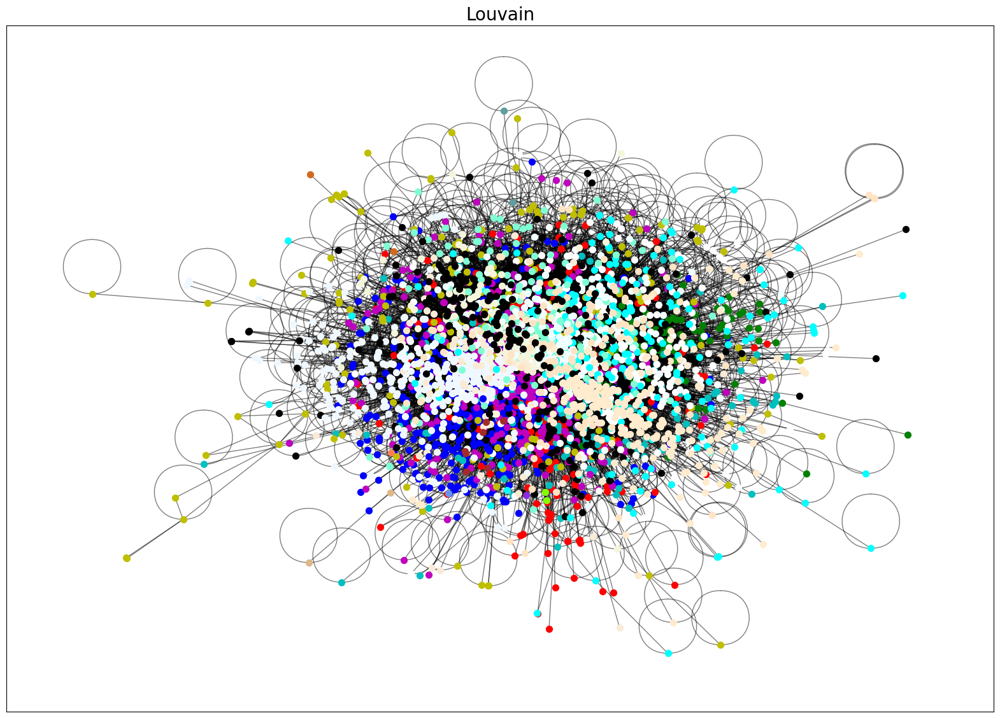

In [ ]:
show_communities(S, louvain, name = 'Louvain')

In [ ]:
fast_greedy = detect_communities_greedy(S)

In [ ]:
len(fast_greedy)

197

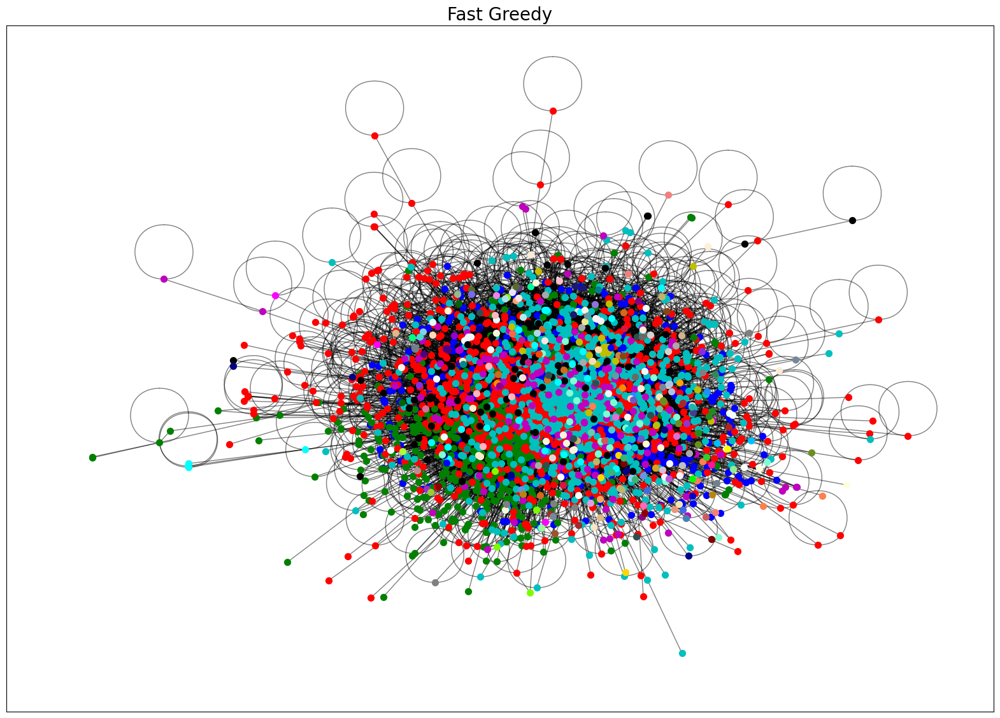

In [ ]:
show_communities(S, fast_greedy, name = 'Fast Greedy')

In [ ]:
label_propagation = detect_communities_label_propagation(S)

In [ ]:
len(label_propagation)

271

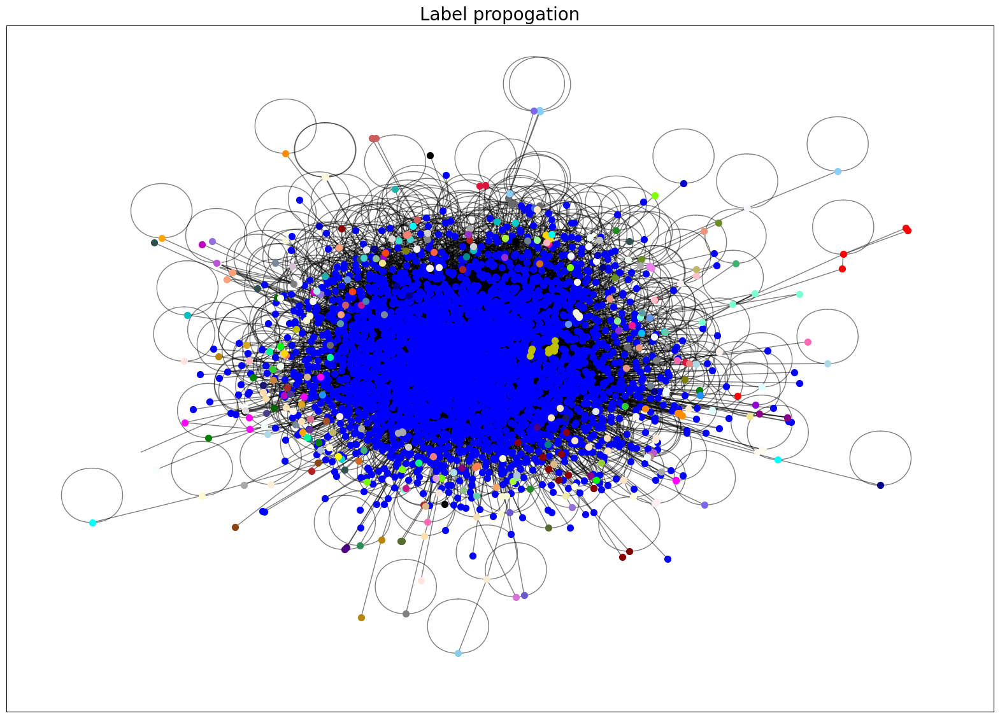

In [ ]:
show_communities(S, label_propagation, name = 'Label propogation')

In [ ]:
pos = nx.spring_layout(G)

In [ ]:
Gp= S.copy()
Gp.remove_edges_from(nx.selfloop_edges(Gp))

In [ ]:
pos = nx.spring_layout(Gp)

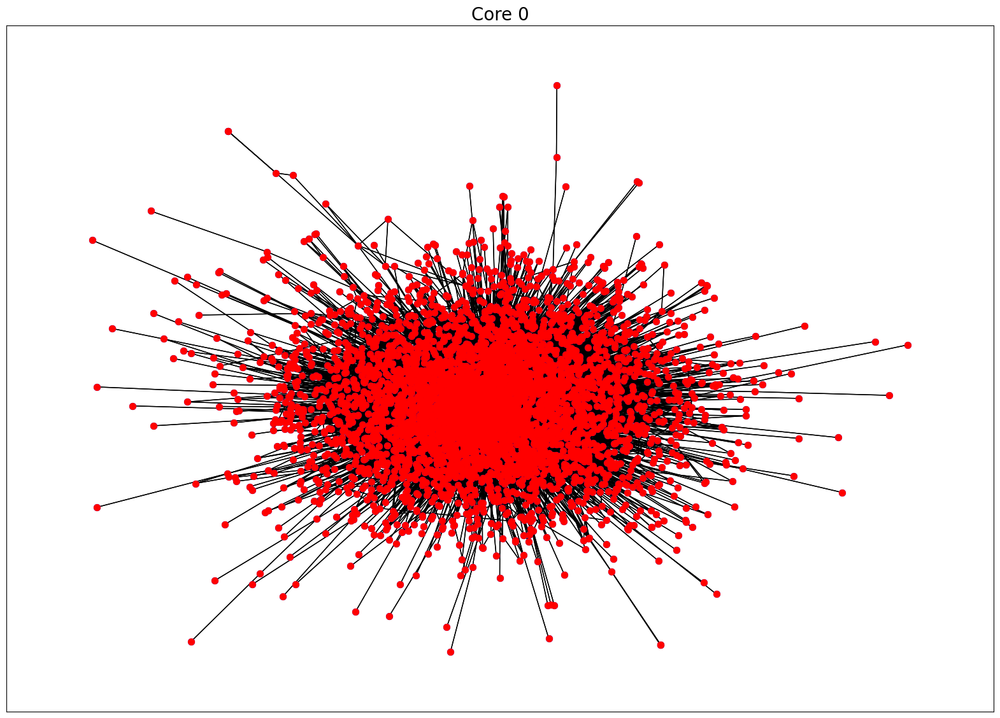

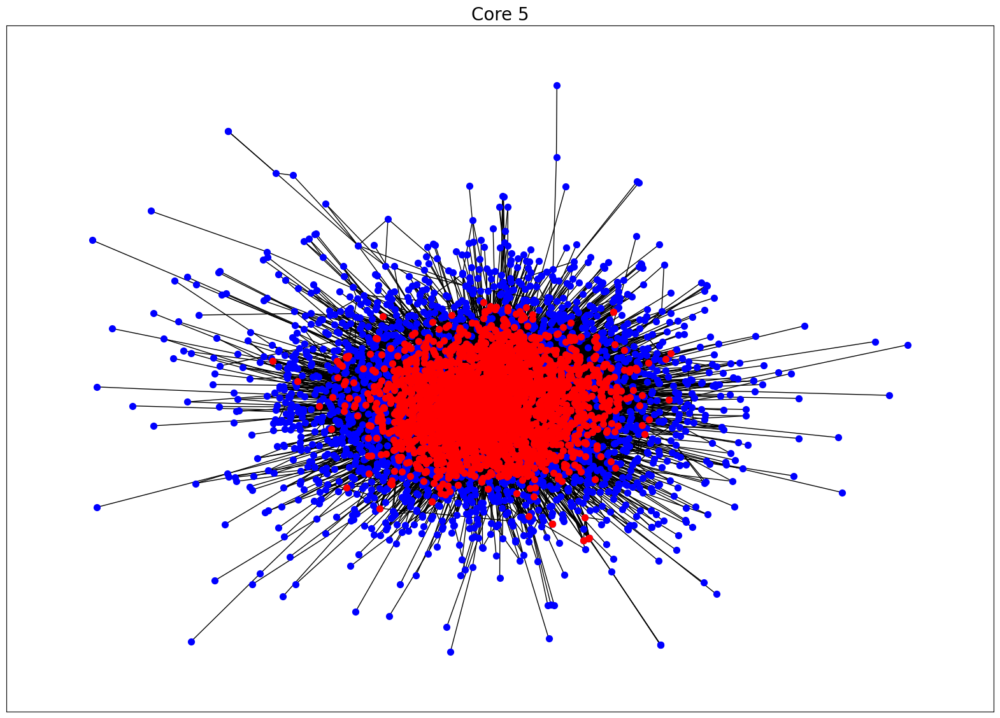

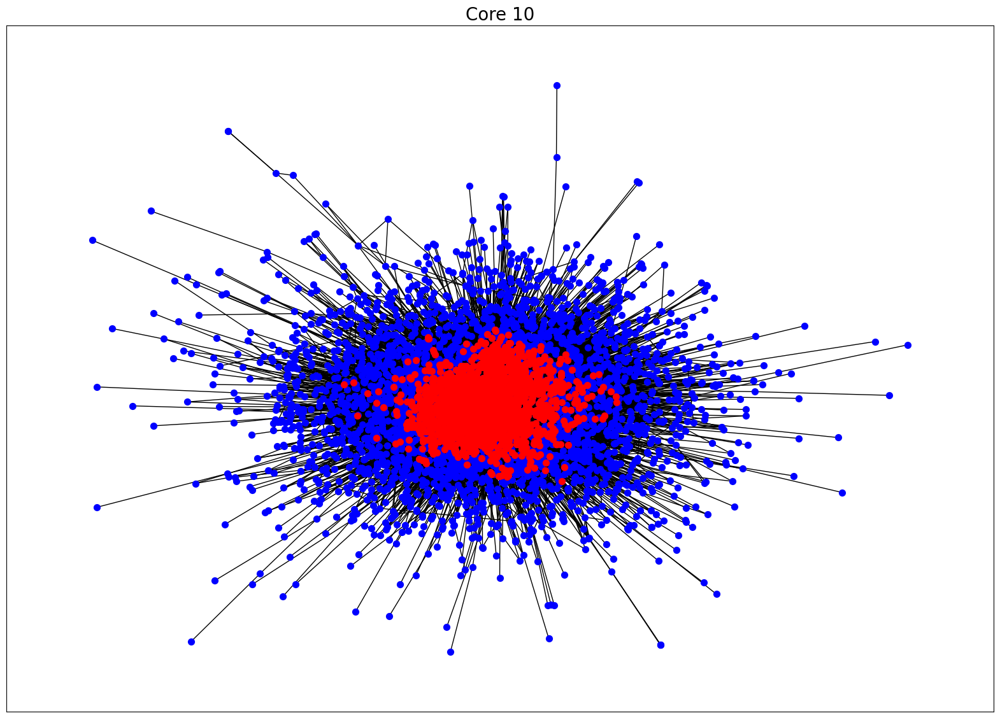

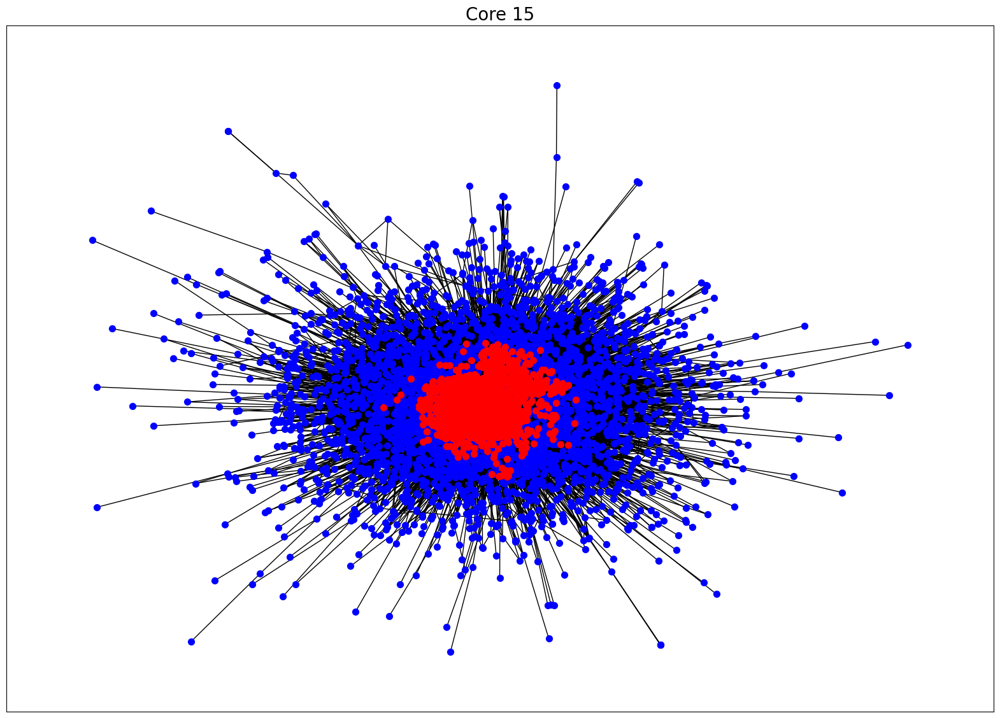

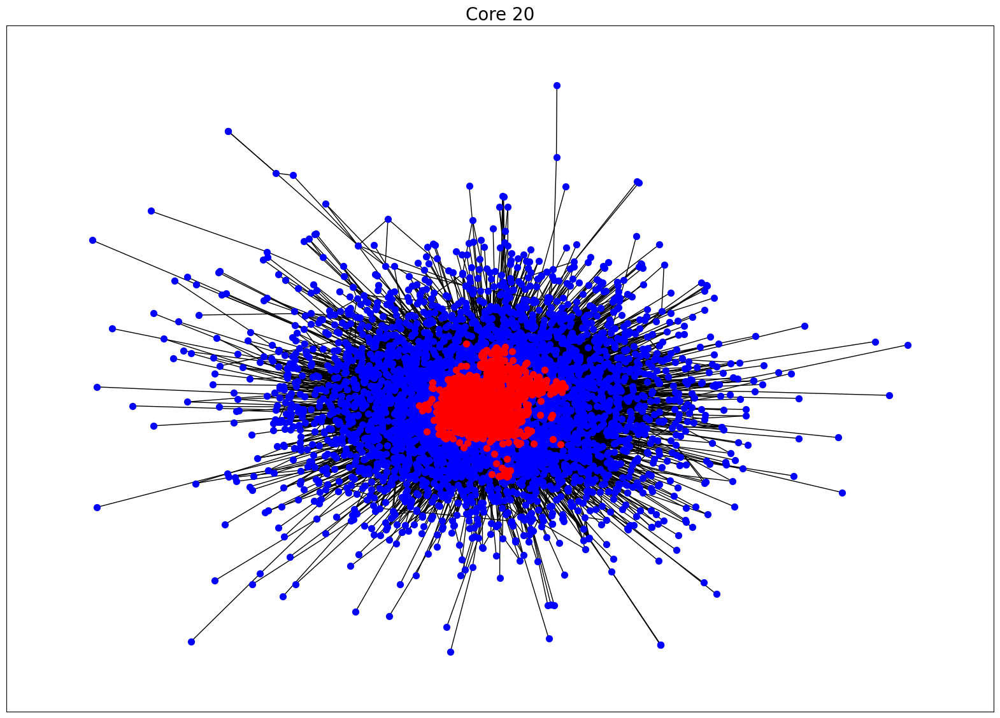

In [ ]:
for core in range(0, 21, 5):
    plt.figure(figsize = (20, 14))
    nx.draw_networkx(Gp, pos = pos, with_labels = False, node_size=50, node_color = 'b')
    plt.title(f'Core {core}', fontsize = 20)
    core_subgraph = nx.k_core(Gp, k = core)

    nx.draw_networkx(core_subgraph, with_labels = False, pos = pos, node_size=50, node_color = 'r')

    plt.show(block = True)

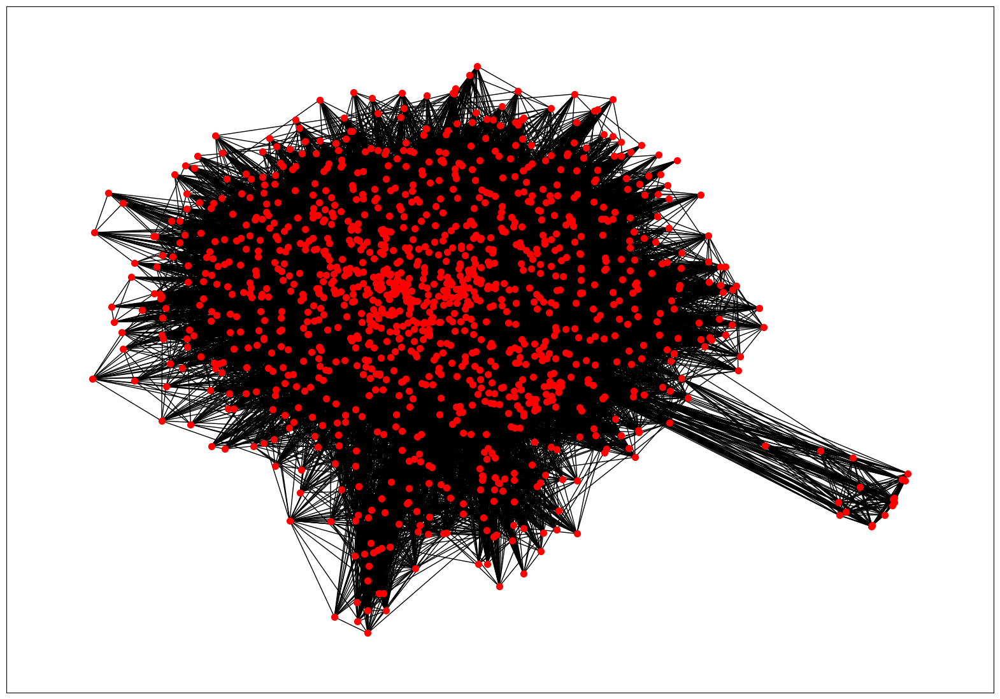

In [ ]:
plt.figure(figsize = (20, 14))
nx.draw_networkx(core_subgraph, with_labels = False, node_size=50, node_color = 'r')
plt.show(block = True)

In [ ]:
len(core_subgraph.nodes()), len(core_subgraph.edges())

(1234, 65007)

In [ ]:
co_affiliation_net = pd.read_csv('drive/MyDrive/co_affiliation_net.csv', sep = ';')
isolated = pd.read_csv('drive/MyDrive/isolated_affiliations.csv', sep = ';')
affiliations = pd.read_csv('drive/MyDrive/affiliations.csv', sep = ';')

In [ ]:
pos = nx.spring_layout(S)

In [ ]:
len(G.nodes()), len(G.edges())

(4634, 85900)

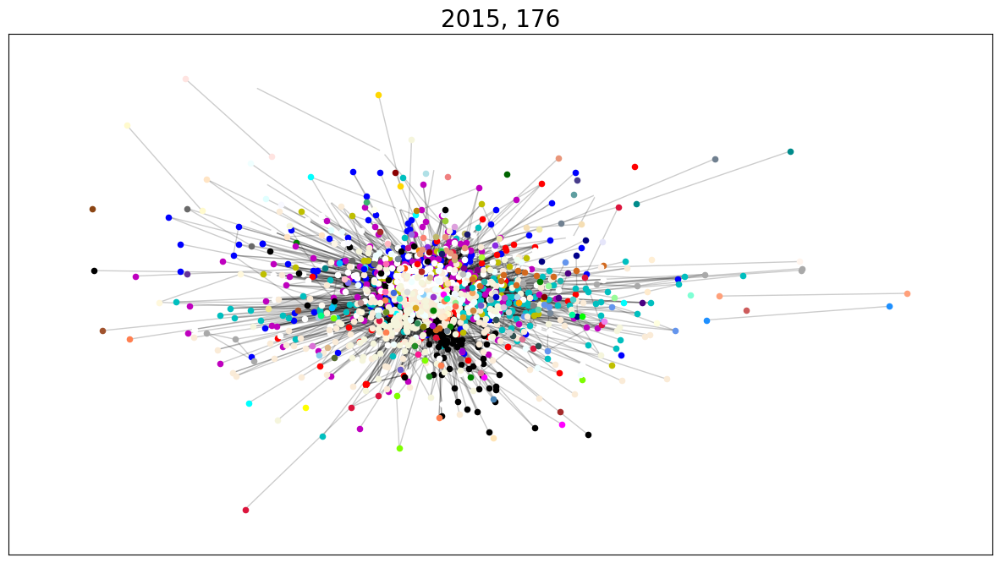

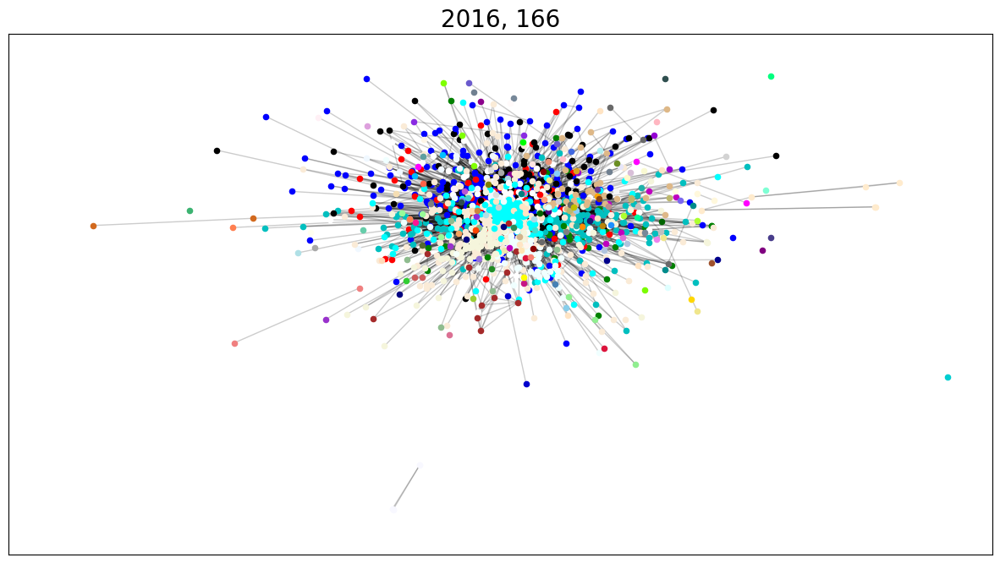

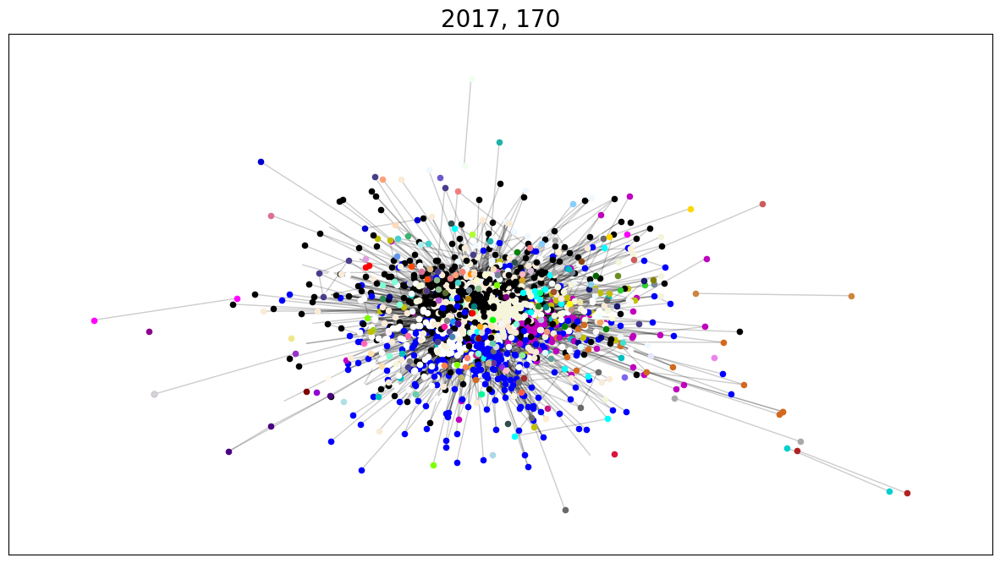

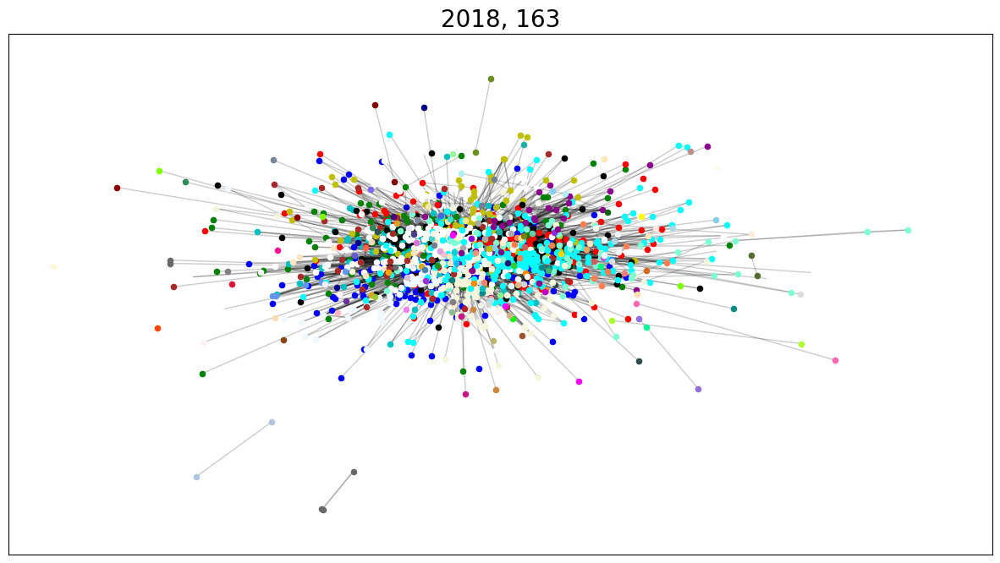

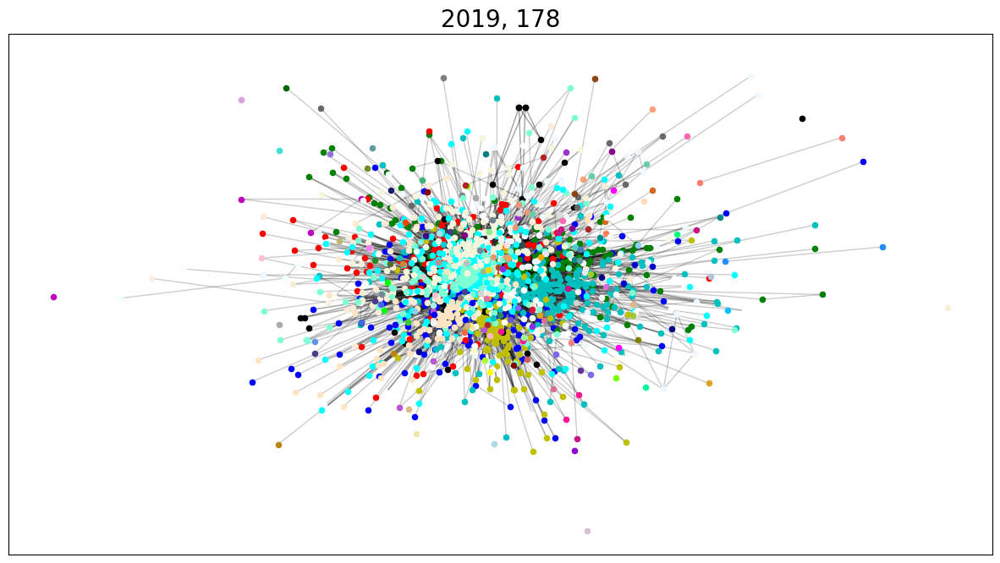

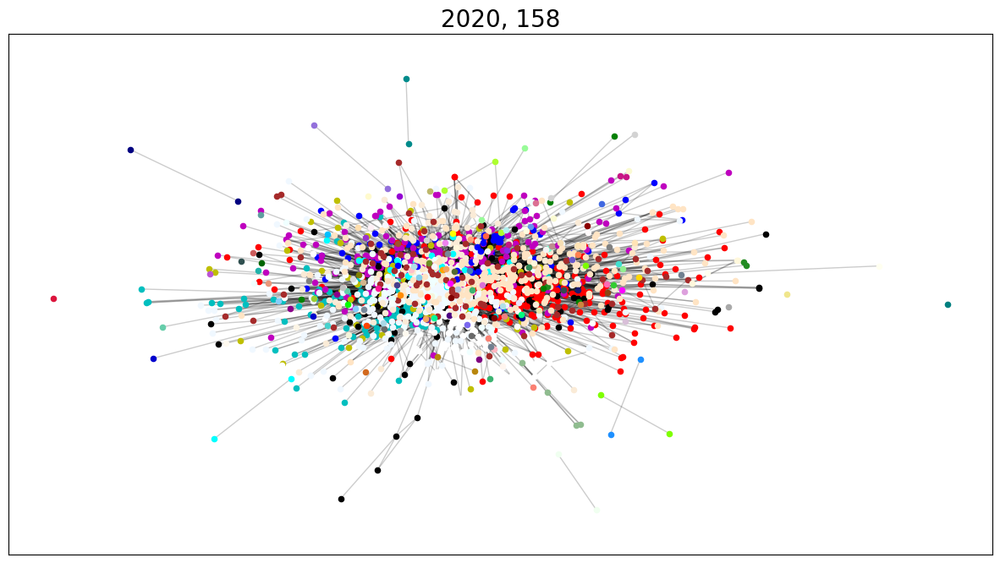

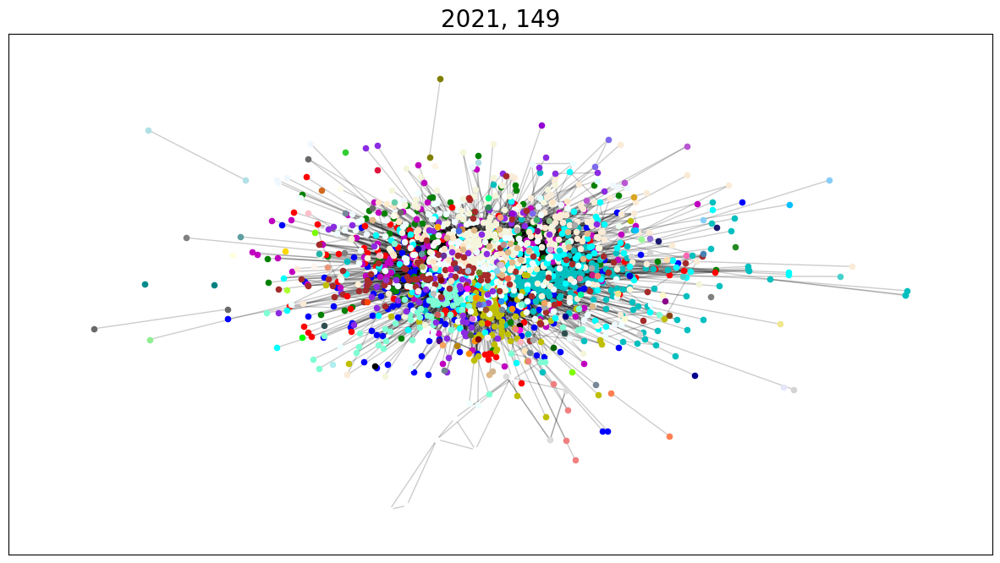

In [ ]:
for year in range(2015, 2022):
    net_year = co_affiliation_net[co_affiliation_net['Y'] == year]
    net_year = net_year[(net_year['AfId1'].isin(list(map(int, S.nodes())))) | (net_year['AfId2'].isin(list(map(int, S.nodes()))))]
    # isolated_year = isolated[isolated['Y'] == year]
    
    net_year[['AfId1', 'AfId2', 'weight']].to_csv(f'net_{year}.txt', sep = '\t', index = False, header = False)

    G_year = nx.read_weighted_edgelist(f'net_{year}.txt', delimiter='\t', nodetype = str)
    G_year.remove_edges_from(nx.selfloop_edges(G_year))   

    plt.figure(figsize = (15, 8))

    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', '#F0F8FF', '#FAEBD7', '#00FFFF', '#7FFFD4', '#F0FFFF', '#F5F5DC', '#FFE4C4', '#000000', '#FFEBCD', '#0000FF', '#8A2BE2', '#A52A2A', '#DEB887', '#5F9EA0', '#7FFF00', '#D2691E', '#FF7F50', '#6495ED', '#FFF8DC', '#DC143C', '#00FFFF', '#00008B', '#008B8B', '#B8860B', '#A9A9A9', '#006400', '#A9A9A9', '#BDB76B', '#8B008B', '#556B2F', '#FF8C00', '#9932CC', '#8B0000', '#E9967A', '#8FBC8F', '#483D8B', '#2F4F4F', '#2F4F4F', '#00CED1', '#9400D3', '#FF1493', '#00BFFF', '#696969', '#696969', '#1E90FF', '#B22222', '#FFFAF0', '#228B22', '#FF00FF', '#DCDCDC', '#F8F8FF', '#FFD700', '#DAA520', '#808080', '#008000', '#ADFF2F', '#808080', '#F0FFF0', '#FF69B4', '#CD5C5C', '#4B0082', '#FFFFF0', '#F0E68C', '#E6E6FA', '#FFF0F5', '#7CFC00', '#FFFACD', '#ADD8E6', '#F08080', '#E0FFFF', '#FAFAD2', '#D3D3D3', '#90EE90', '#D3D3D3', '#FFB6C1', '#FFA07A', '#20B2AA', '#87CEFA', '#778899', '#778899', '#B0C4DE', '#FFFFE0', '#00FF00', '#32CD32', '#FAF0E6', '#FF00FF', '#800000', '#66CDAA', '#0000CD', '#BA55D3', '#9370DB', '#3CB371', '#7B68EE', '#00FA9A', '#48D1CC', '#C71585', '#191970', '#F5FFFA', '#FFE4E1', '#FFE4B5', '#FFDEAD', '#000080', '#FDF5E6', '#808000', '#6B8E23', '#FFA500', '#FF4500', '#DA70D6', '#EEE8AA', '#98FB98', '#AFEEEE', '#DB7093', '#FFEFD5', '#FFDAB9', '#CD853F', '#FFC0CB', '#DDA0DD', '#B0E0E6', '#800080', '#663399', '#FF0000', '#BC8F8F', '#4169E1', '#8B4513', '#FA8072', '#F4A460', '#2E8B57', '#FFF5EE', '#A0522D', '#C0C0C0', '#87CEEB', '#6A5ACD', '#708090', '#708090', '#FFFAFA', '#00FF7F', '#4682B4', '#D2B48C', '#008080', '#D8BFD8', '#FF6347', '#40E0D0', '#EE82EE', '#F5DEB3', '#FFFFFF', '#F5F5F5', '#FFFF00', '#9ACD32'] * 1000
    
    aux = 0
    communities = detect_communities_louvain(G_year)

    for community in communities:
        nx.draw_networkx_nodes(G_year, pos, community, node_size = 20, node_color = colors[aux])
        aux = aux + 1
    nx.draw_networkx_edges(G_year, pos, alpha=0.2)

    plt.title(f'{year}, {len(communities)}', fontsize = 20)

    plt.show(block = True)

In [ ]:
def show_save_communities(G, communities, pos, name = 'Communities ', id_col = 'Id',
                          folder = 'community', comm_file = 'communities.csv', image_file = 'image.png', text = ''):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', '#F0F8FF', '#FAEBD7', '#00FFFF', '#7FFFD4', '#F0FFFF', '#F5F5DC', '#FFE4C4', '#000000', '#FFEBCD', '#0000FF', '#8A2BE2', '#A52A2A', '#DEB887', '#5F9EA0', '#7FFF00', '#D2691E', '#FF7F50', '#6495ED', '#FFF8DC', '#DC143C', '#00FFFF', '#00008B', '#008B8B', '#B8860B', '#A9A9A9', '#006400', '#A9A9A9', '#BDB76B', '#8B008B', '#556B2F', '#FF8C00', '#9932CC', '#8B0000', '#E9967A', '#8FBC8F', '#483D8B', '#2F4F4F', '#2F4F4F', '#00CED1', '#9400D3', '#FF1493', '#00BFFF', '#696969', '#696969', '#1E90FF', '#B22222', '#FFFAF0', '#228B22', '#FF00FF', '#DCDCDC', '#F8F8FF', '#FFD700', '#DAA520', '#808080', '#008000', '#ADFF2F', '#808080', '#F0FFF0', '#FF69B4', '#CD5C5C', '#4B0082', '#FFFFF0', '#F0E68C', '#E6E6FA', '#FFF0F5', '#7CFC00', '#FFFACD', '#ADD8E6', '#F08080', '#E0FFFF', '#FAFAD2', '#D3D3D3', '#90EE90', '#D3D3D3', '#FFB6C1', '#FFA07A', '#20B2AA', '#87CEFA', '#778899', '#778899', '#B0C4DE', '#FFFFE0', '#00FF00', '#32CD32', '#FAF0E6', '#FF00FF', '#800000', '#66CDAA', '#0000CD', '#BA55D3', '#9370DB', '#3CB371', '#7B68EE', '#00FA9A', '#48D1CC', '#C71585', '#191970', '#F5FFFA', '#FFE4E1', '#FFE4B5', '#FFDEAD', '#000080', '#FDF5E6', '#808000', '#6B8E23', '#FFA500', '#FF4500', '#DA70D6', '#EEE8AA', '#98FB98', '#AFEEEE', '#DB7093', '#FFEFD5', '#FFDAB9', '#CD853F', '#FFC0CB', '#DDA0DD', '#B0E0E6', '#800080', '#663399', '#FF0000', '#BC8F8F', '#4169E1', '#8B4513', '#FA8072', '#F4A460', '#2E8B57', '#FFF5EE', '#A0522D', '#C0C0C0', '#87CEEB', '#6A5ACD', '#708090', '#708090', '#FFFAFA', '#00FF7F', '#4682B4', '#D2B48C', '#008080', '#D8BFD8', '#FF6347', '#40E0D0', '#EE82EE', '#F5DEB3', '#FFFFFF', '#F5F5F5', '#FFFF00', '#9ACD32'] * 1000
    plt.figure(figsize = (14, 7))
    plt.title(name, fontsize = 20)
    aux = 0
    community_df = pd.DataFrame()
    
    for community in communities:
       nx.draw_networkx_nodes(G, pos, community, node_size = 20, node_color = colors[aux])
       aux = aux + 1

       for comm in community:
           community_df.loc[comm, 'community'] = aux
    
    community_df = community_df.reset_index().rename(columns = {'index': id_col})
    
    if path.exists(folder) == False:
        os.mkdir(folder)
    community_df.to_csv(folder + '/' + comm_file, sep = ';', index = False)
    
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    plt.xlabel(text)
    # plt.show(block = True)
    plt.savefig(folder + '/' + image_file)


def find_save_communities(net, isolated = None, directed = False, id_col = 'Id', by_years = False, community_func = detect_communities_louvain,
                          largest_comp = False, core = False, folder = 'community', method_name = ''):
    net_no_periods = net.groupby([id_col + '1', id_col + '2']).sum()['weight'].reset_index()

    if path.exists(folder) == False:
        os.mkdir(folder)

    net_no_periods.to_csv(folder + '/' + 'net_comm.txt', sep = '\t', index = False, header = False)

    if directed: 
        G = nx.read_weighted_edgelist(folder + '/' + 'net_comm.txt', delimiter='\t', create_using=nx.DiGraph, nodetype = str)
    else:
        G = nx.read_weighted_edgelist(folder + '/' + 'net_comm.txt', delimiter='\t', nodetype = str)
    if isolated is not None:
        G.add_nodes_from(isolated[id_col])

    G.remove_edges_from(nx.selfloop_edges(G))    

    if largest_comp:
        if directed:
            components = nx.weakly_connected_components(G)
        else:
            components = nx.connected_components(G)
        comp_df = pd.DataFrame()
        i = 1
        for comp in components:
            for au in comp:
                comp_df.loc[au, 'component'] = i
            i += 1
                    
        comp_df = comp_df.reset_index().rename(columns = {'index': id_col})
        cnt_comp = comp_df.groupby('component').count().reset_index().rename(columns = {id_col:'count'})
        max_comp = cnt_comp[cnt_comp['count'] == np.max(cnt_comp['count'].values)]['component'].values[0]

        S = G.subgraph(set(comp_df[comp_df['component'] == max_comp][id_col].values)).copy()
    else:
        S = G.copy()
    if core:
        S = nx.k_core(S, k = core)

    pos = nx.spring_layout(S)

    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', '#F0F8FF', '#FAEBD7', '#00FFFF', '#7FFFD4', '#F0FFFF', '#F5F5DC', '#FFE4C4', '#000000', '#FFEBCD', '#0000FF', '#8A2BE2', '#A52A2A', '#DEB887', '#5F9EA0', '#7FFF00', '#D2691E', '#FF7F50', '#6495ED', '#FFF8DC', '#DC143C', '#00FFFF', '#00008B', '#008B8B', '#B8860B', '#A9A9A9', '#006400', '#A9A9A9', '#BDB76B', '#8B008B', '#556B2F', '#FF8C00', '#9932CC', '#8B0000', '#E9967A', '#8FBC8F', '#483D8B', '#2F4F4F', '#2F4F4F', '#00CED1', '#9400D3', '#FF1493', '#00BFFF', '#696969', '#696969', '#1E90FF', '#B22222', '#FFFAF0', '#228B22', '#FF00FF', '#DCDCDC', '#F8F8FF', '#FFD700', '#DAA520', '#808080', '#008000', '#ADFF2F', '#808080', '#F0FFF0', '#FF69B4', '#CD5C5C', '#4B0082', '#FFFFF0', '#F0E68C', '#E6E6FA', '#FFF0F5', '#7CFC00', '#FFFACD', '#ADD8E6', '#F08080', '#E0FFFF', '#FAFAD2', '#D3D3D3', '#90EE90', '#D3D3D3', '#FFB6C1', '#FFA07A', '#20B2AA', '#87CEFA', '#778899', '#778899', '#B0C4DE', '#FFFFE0', '#00FF00', '#32CD32', '#FAF0E6', '#FF00FF', '#800000', '#66CDAA', '#0000CD', '#BA55D3', '#9370DB', '#3CB371', '#7B68EE', '#00FA9A', '#48D1CC', '#C71585', '#191970', '#F5FFFA', '#FFE4E1', '#FFE4B5', '#FFDEAD', '#000080', '#FDF5E6', '#808000', '#6B8E23', '#FFA500', '#FF4500', '#DA70D6', '#EEE8AA', '#98FB98', '#AFEEEE', '#DB7093', '#FFEFD5', '#FFDAB9', '#CD853F', '#FFC0CB', '#DDA0DD', '#B0E0E6', '#800080', '#663399', '#FF0000', '#BC8F8F', '#4169E1', '#8B4513', '#FA8072', '#F4A460', '#2E8B57', '#FFF5EE', '#A0522D', '#C0C0C0', '#87CEEB', '#6A5ACD', '#708090', '#708090', '#FFFAFA', '#00FF7F', '#4682B4', '#D2B48C', '#008080', '#D8BFD8', '#FF6347', '#40E0D0', '#EE82EE', '#F5DEB3', '#FFFFFF', '#F5F5F5', '#FFFF00', '#9ACD32'] * 1000
    
    if not by_years:
        communities = community_func(S)
        show_save_communities(S, communities, pos, name = 'Communities ' + method_name, id_col = id_col,
                          folder = folder, comm_file = 'communities.csv', image_file = 'image.png', text = f'{len(communities)} communities')
        return

    for year in range(2015, 2022):
        net_year = net[net['Y'] == year]
        net_year = net_year[(net_year[id_col + '1'].isin(list(map(int, S.nodes())))) | (net_year[id_col + '2'].isin(list(map(int, S.nodes()))))]
        
        net_year[[id_col + '1', id_col + '2', 'weight']].to_csv(folder + '/' + f'net_{year}.txt', sep = '\t', index = False, header = False)

        G_year = nx.read_weighted_edgelist(folder + '/' + f'net_{year}.txt', delimiter='\t', nodetype = str)
        if directed: 
            G_year = nx.read_weighted_edgelist(folder + '/' + f'net_{year}.txt', delimiter='\t', create_using=nx.DiGraph, nodetype = str)
        else:
            G_year = nx.read_weighted_edgelist(folder + '/' + f'net_{year}.txt', delimiter='\t', nodetype = str)

        if isolated is not None:
            isolated_year = isolated[isolated['Y'] == year]
            G_year.add_nodes_from(isolated_year[id_col]) 
        G_year.remove_edges_from(nx.selfloop_edges(G_year))   

        plt.figure(figsize = (15, 8))

        aux = 0
        communities = detect_communities_louvain(G_year)
        
        show_save_communities(G_year, communities, pos, name = 'Communities ' + method_name +  ' ' + str(year), id_col = id_col,
                          folder = folder, comm_file = f'communities_{year}.csv', image_file = f'image_{year}.png', text = f'{len(communities)} communities')



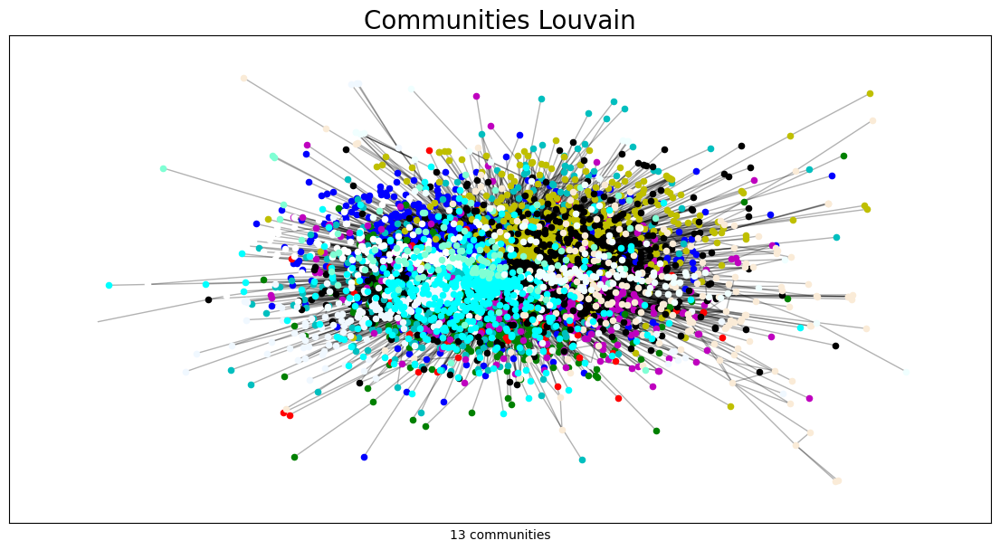

In [ ]:
find_save_communities(co_affiliation_net, isolated = None, directed = False, id_col = 'AfId', by_years = False, community_func = detect_communities_louvain,
                          largest_comp = True, core = False, folder = 'community', method_name = 'Louvain')

<Figure size 1500x800 with 0 Axes>

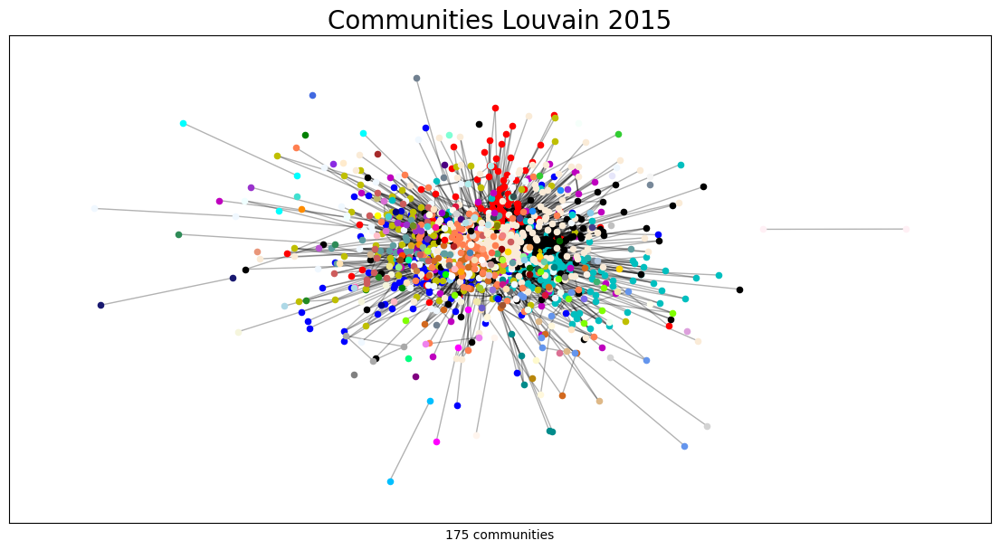

<Figure size 1500x800 with 0 Axes>

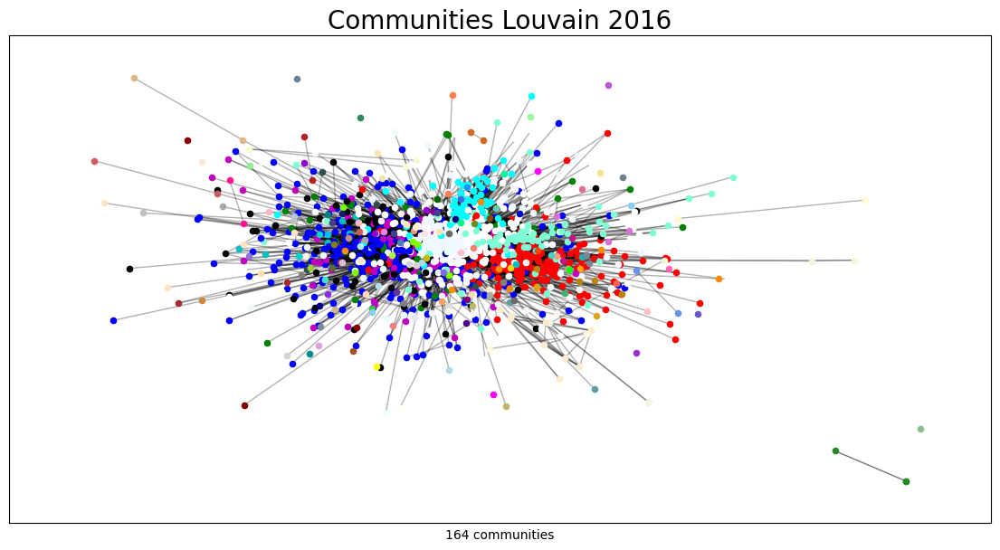

<Figure size 1500x800 with 0 Axes>

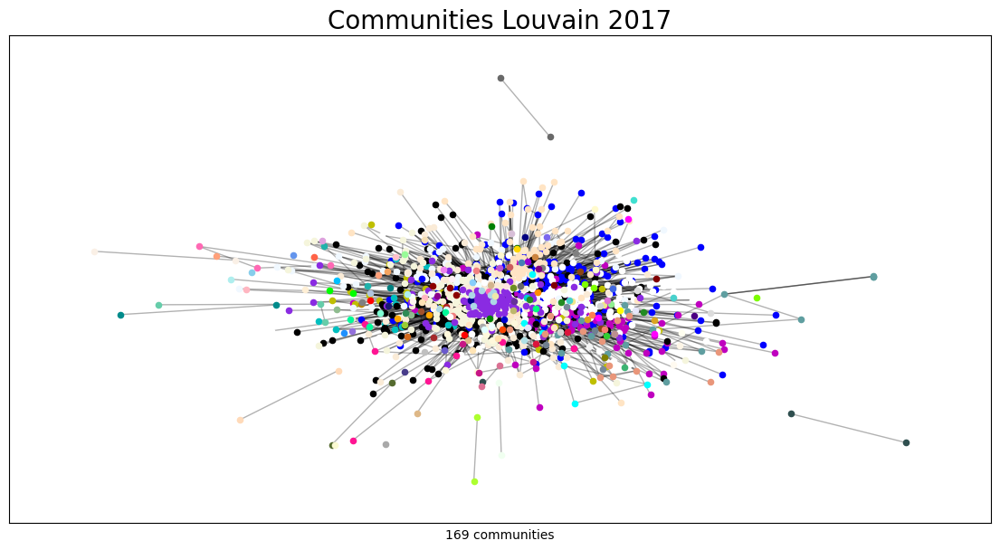

<Figure size 1500x800 with 0 Axes>

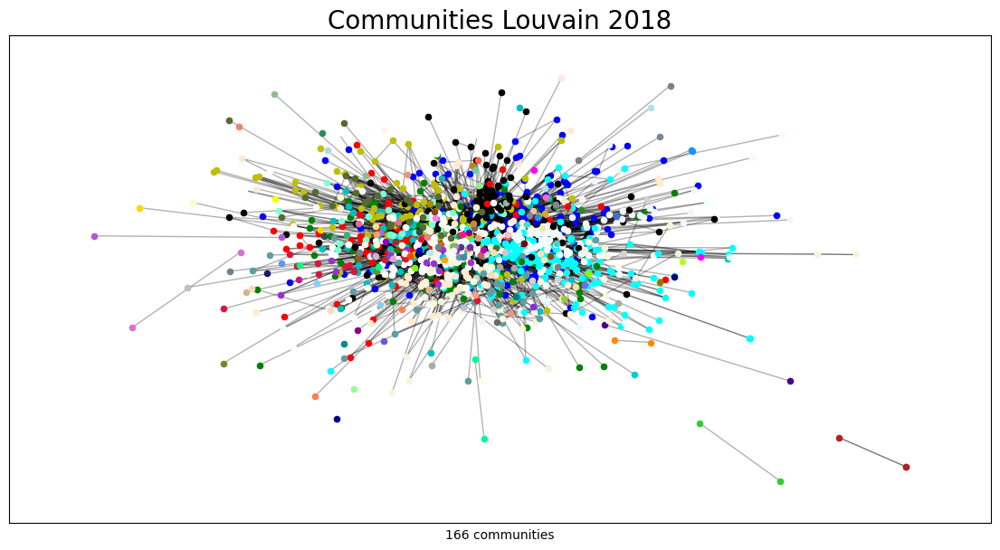

<Figure size 1500x800 with 0 Axes>

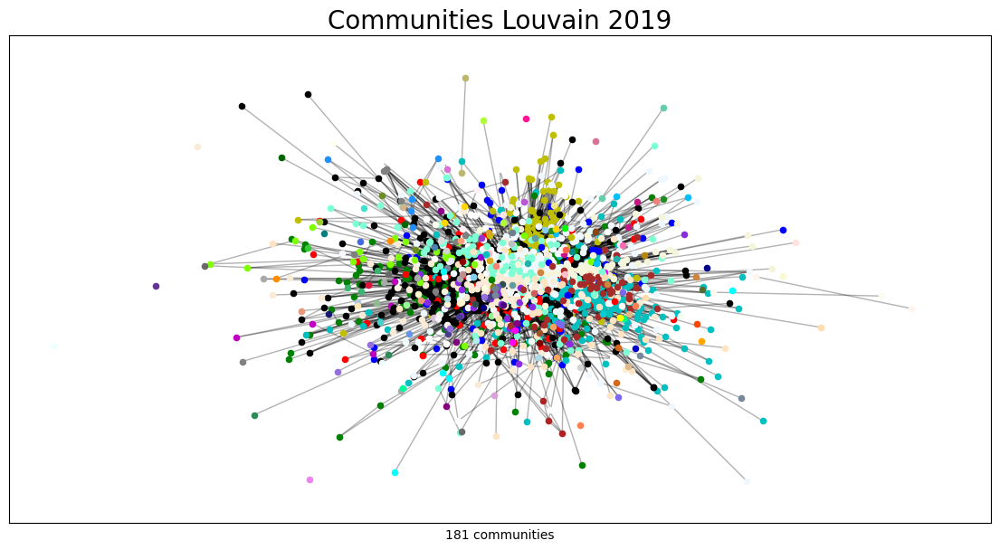

<Figure size 1500x800 with 0 Axes>

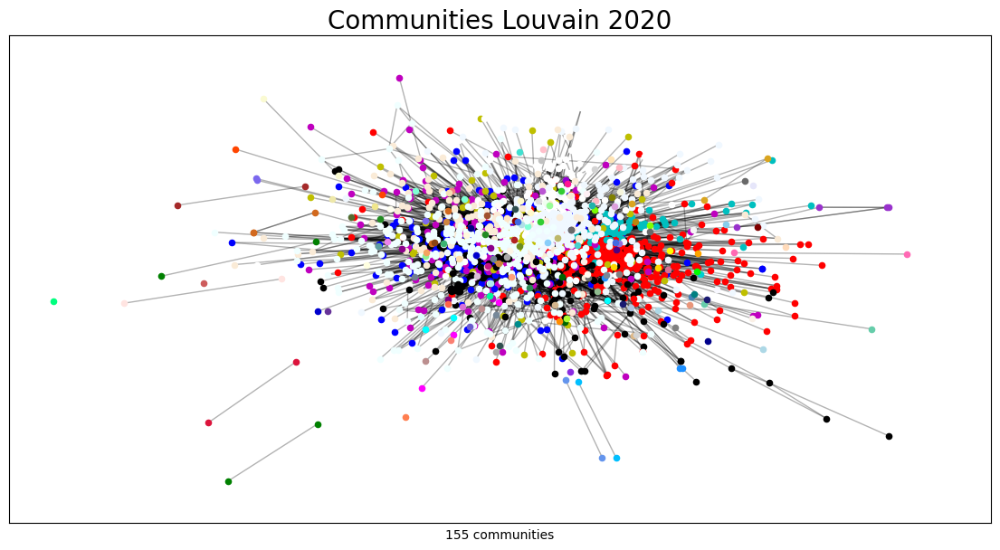

<Figure size 1500x800 with 0 Axes>

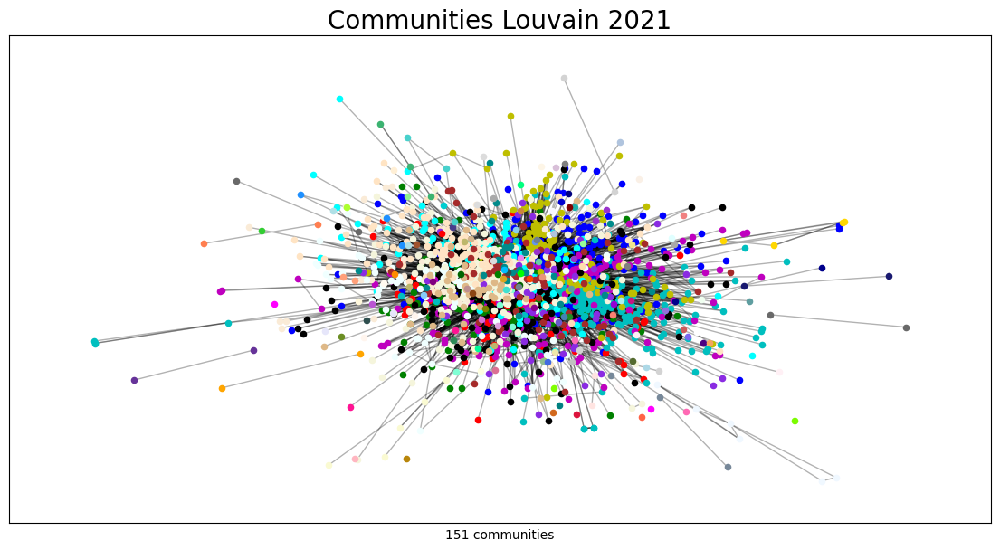

In [ ]:
find_save_communities(co_affiliation_net, isolated = None, directed = False, id_col = 'AfId', by_years = True, community_func = detect_communities_louvain,
                          largest_comp = True, core = False, folder = 'community_years', method_name = 'Louvain')

In [ ]:
import shutil
shutil.make_archive('community_co_affiliation', 'zip', '/content/community')

'/content/community_co_affiliation.zip'

In [ ]:
shutil.make_archive('community_co_affiliation_years', 'zip', '/content/community_years')

'/content/community_co_affiliation_years.zip'